# Classifying Room Occupancy according to <br> Four Environmental Factors

## 1. Introduction
In today’s world, the use of home-based technology systems is becoming increasingly utilized for our convenience. Household technology such as Amazon’s Alexa, Google Assistant and Apple’s Siri are used every day by millions of families and can be an integral aspect of one’s quality of life. We want to explore how this technology can be further improved by analyzing how it can detect occupancy in a room.

Our dataset analyzes room occupancy based on the measurements of temperature, humidity, light, and CO2 levels in the room. In our dataset, occupancy is the categorical variable, whether the room is occupied or unoccupied. We found this dataset interesting to investigate due to the categorical variables allowing us to do a classification analysis, and with environmental variables that allow us to make this prediction. More specifically, we wanted to analyze the question: Is the room occupied based on temperature, humidity, light, and CO2 levels


## 2. Preliminary Exploratory Data Analysis

#### Accessing Data
First, we will load the tidyverse library. Then, we need to download our data and save it as a tibble for future data wrangling.
Our data was only available as a .zip file, so we downloaded it, unzipped the necessary data, and read it into a CSV.

In [1]:
library(tidyverse)
library(repr)
library(tidymodels)

temp <- tempfile()
download.file("https://archive.ics.uci.edu/static/public/357/occupancy+detection.zip",temp)
data <- read.csv(unz(temp, "datatraining.txt"))
unlink(temp)

occupancyData <- tibble(data)
head(occupancyData)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filt

date,Temperature,Humidity,Light,CO2,HumidityRatio,Occupancy
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
2015-02-04 17:51:00,23.18,27.2720,426.0,721.25,0.004792988,1
2015-02-04 17:51:59,23.15,27.2675,429.5,714.00,0.004783441,1
2015-02-04 17:53:00,23.15,27.2450,426.0,713.50,0.004779464,1
2015-02-04 17:54:00,23.15,27.2000,426.0,708.25,0.004771509,1
2015-02-04 17:55:00,23.10,27.2000,426.0,704.50,0.004756993,1
2015-02-04 17:55:59,23.10,27.2000,419.0,701.00,0.004756993,1


#### Selecting Necessary Columns
We don't need date, and we don't need HumidityRatio (as we already have humidity) but all other columns are necessary.

In [2]:
selectedOccupancyData <- occupancyData[,-c(1, 6)]
head(selectedOccupancyData)

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.18,27.2720,426.0,721.25,1
23.15,27.2675,429.5,714.00,1
23.15,27.2450,426.0,713.50,1
23.15,27.2000,426.0,708.25,1
23.10,27.2000,426.0,704.50,1
23.10,27.2000,419.0,701.00,1


#### Splitting Data For Training / Testing
Now that we have only the necessary columns, we will continue to split the data into training and testing sets.
We will use a 75/25 split.

In [3]:
occupancy_split <- initial_split(selectedOccupancyData, prop = 0.75, strata = Occupancy)  
occupancy_train <- training(occupancy_split)
occupancy_test <- testing(occupancy_split)

head(occupancy_train)
head(occupancy_test)

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
22.945,27.290,0,685.0,0
22.945,27.390,0,685.0,0
22.890,27.390,0,689.0,0
22.890,27.390,0,689.0,0
22.890,27.445,0,691.0,0
22.890,27.500,0,689.5,0


Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.15,27.26750,429.5,714.0,1
23.00,27.20000,0.0,681.5,0
22.89,27.39000,0.0,689.5,0
22.89,27.50000,0.0,688.0,0
22.70,27.50000,0.0,670.0,0
22.60,27.35667,0.0,658.0,0


#### Summarizing the Data
We will summarize the data, counting the various values and checking for empty/NA

In [4]:
# Summarizing the data
summary_table <- occupancy_train |>
    # Summarize each column
    summarise(
        Total_Observations = n(),
        Missing_Temperature = sum(is.na(Temperature)),
        Mean_Temperature = mean(Temperature, na.rm = TRUE),
        Missing_Humidity = sum(is.na(Humidity)),
        Mean_Humidity = mean(Humidity, na.rm = TRUE),
        Missing_Light = sum(is.na(Light)),
        Mean_Light = mean(Light, na.rm = TRUE),
        Missing_CO2 = sum(is.na(CO2)),
        Mean_CO2 = mean(CO2, na.rm = TRUE),
        Occupancy_Count_0 = sum(Occupancy == 0, na.rm = TRUE),
        Occupancy_Count_1 = sum(Occupancy == 1, na.rm = TRUE))

# View the summary table
summary_table

Total_Observations,Missing_Temperature,Mean_Temperature,Missing_Humidity,Mean_Humidity,Missing_Light,Mean_Light,Missing_CO2,Mean_CO2,Occupancy_Count_0,Occupancy_Count_1
<int>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<int>
6106,0,20.61299,0,25.68401,0,118.7344,0,605.3359,4810,1296


#### Visualizing the Data

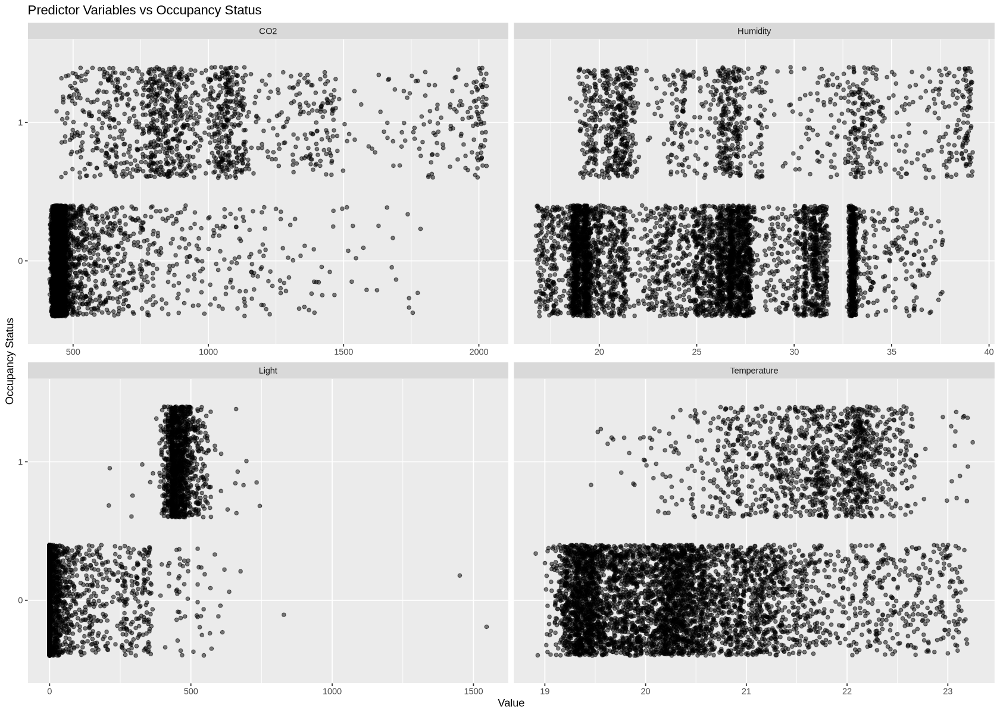

In [5]:
options(repr.plot.width=14, repr.plot.height=10)

# Reshape data to long format for faceting
occupancy_long <- occupancy_train |>
    pivot_longer(cols = -Occupancy, names_to = "variable", values_to = "value")

# Create a 2x2 grid of scatterplots with jitter
combined_plot <- ggplot(occupancy_long, aes(x = value, y = as.factor(Occupancy))) +
    geom_jitter(alpha = 0.5, width = 0.1) +
    facet_wrap(~variable, scales = "free_x", ncol = 2) +
    labs(x = "Value", y = "Occupancy Status", title = "Predictor Variables vs Occupancy Status")

# Print the combined plot
print(combined_plot)

Description of the graph

## 4. Expected Outcomes and Significance:We expect to find higher humidities, temperatures, light and CO2 levels when a room is occupied. These findings could be presented to household technology companies, allowing them to develop more sensors into their systems; allowing for systems to become more sensitive to whether a person is present in the room or not. Features such as automatic lights could become more accurate and prevalent within households. This study is not only limited to temperature, humidity, light, and CO2 levels; future studies could explore other measurements such as oxygen levels, noise levels, or dust particles in the room. By analyzing more variables, the occupancy detection of household systems will be optimized, significantly boosting the quality of life of millions around the world.

